## Forecasting and Monitoring Hospitalization Trends from Respiratory Viruses in Kenya: A Time Series Analysis by County
 (Using U.S. Government Data as a Proxy)


## Business Understanding

Kenya faces challenges in tracking and predicting hospitalizations caused by respiratory viruses like COVID-19, Influenza, and RSV due to limited real-time health data. Since local data is scarce, this project uses public hospitalization records from the United States (provided by agencies like the CDC and HHS) as a reliable substitute. By analyzing these structured records, the project demonstrates how a data-driven approach could be applied in Kenya in the future. The goal is to develop a system that can forecast hospitalization trends, detect unexpected surges, and support timely public health actions. When Kenya establishes a similar data infrastructure, the insights from this study can help shape policies, allocate resources, and improve healthcare preparedness.

# Problem Statement

Kenya lacks a robust real-time health surveillance system to track and predict hospitalizations caused by respiratory viruses like COVID-19, Influenza, and RSV. The absence of structured local data makes it difficult to anticipate hospitalization trends and respond effectively to surges. By leveraging publicly available U.S. hospitalization data as a proxy, this project aims to demonstrate how a data-driven forecasting approach could be implemented in Kenya. The ultimate goal is to support timely public health interventions, optimize resource allocation, and enhance preparedness once a local data infrastructure is established.

# Objectives
  To monitor, model, and forecast respiratory virus-related hospitalization   

1.     To monitor, model, and forecast respiratory virus-related hospitalization trends across U.S. jurisdictions to support healthcare resource planning, outbreak response, and policy decisions.

2. Detect patterns and seasonality in respiratory virus hospitalizations.
3.  Forecast future hospitalization trends at the national and jurisdictional levels.
4. Evaluate the impact of interventions (vaccinations, NPIs) on hospitalization metrics.
5. Provide real-time dashboards for public health stakeholders.


## **Stakeholders**
1. CDC and local health departments
2. Hospital administrators and planners
3. Epidemiologists and public health researchers
4. Policy-makers and emergency response teams



EDA



In [ ]:
!pip install statsmodels


In [ ]:
!pip install sktime

In [ ]:
#import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

In [ ]:
# load the dataset
rvr_df = pd.read_csv("/content/RVR.csv")
rvr_df.head()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,...,absolute_change_average_percent_staff_pediatric_icu_beds_occupied,admissions_00_04_covid_confirmed,admissions_05_11_covid_confirmed,admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed,average_admissions_05_11_covid_confirmed,average_admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed_per_100k,average_admissions_05_11_covid_confirmed_per_100k,average_admissions_12_17_covid_confirmed_per_100k
0,AZ,8/1/2020,55,95,95,26,16,35,16.0,6,...,3.774523,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AZ,8/2/2020,76,95,124,29,24,34,12.0,8,...,-0.040802,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AZ,8/3/2020,82,95,100,26,21,28,14.0,13,...,-8.305584,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AZ,8/4/2020,81,95,121,32,23,32,12.0,12,...,-5.207254,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AZ,8/5/2020,84,95,120,27,28,35,14.0,14,...,-5.779696,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
rvr_df.tail()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,...,absolute_change_average_percent_staff_pediatric_icu_beds_occupied,admissions_00_04_covid_confirmed,admissions_05_11_covid_confirmed,admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed,average_admissions_05_11_covid_confirmed,average_admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed_per_100k,average_admissions_05_11_covid_confirmed_per_100k,average_admissions_12_17_covid_confirmed_per_100k
42391,Region 8,8/12/2022,341,351,190,94,20,42,15.0,10,...,-0.070616,12.0,4.0,5.0,6.571429,2.142857,3.142857,0.830398,0.185431,0.313243
42392,Region 8,8/13/2022,342,351,176,82,21,40,18.0,13,...,1.697442,11.0,2.0,5.0,7.285714,2.000000,3.571429,0.920659,0.173069,0.355958
42393,Region 8,8/14/2022,341,351,148,63,25,45,16.0,10,...,2.851391,5.0,2.0,2.0,7.857143,2.285714,3.428571,0.992867,0.197793,0.341720
42394,Region 8,8/15/2022,343,351,145,69,17,45,18.0,9,...,4.697064,5.0,5.0,2.0,7.857143,2.714286,3.142857,0.992867,0.234879,0.313243
42395,Region 8,8/16/2022,342,351,180,87,21,46,20.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print(rvr_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42396 entries, 0 to 42395
Columns: 115 entries, jurisdiction to average_admissions_12_17_covid_confirmed_per_100k
dtypes: float64(105), int64(8), object(2)
memory usage: 37.2+ MB
None


In [ ]:
rvr_df.describe()

,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,admissions_40_49_covid_confirmed,admissions_18_29_covid_confirmed,...,absolute_change_average_percent_staff_pediatric_icu_beds_occupied,admissions_00_04_covid_confirmed,admissions_05_11_covid_confirmed,admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed,average_admissions_05_11_covid_confirmed,average_admissions_12_17_covid_confirmed,average_admissions_00_04_covid_confirmed_per_100k,average_admissions_05_11_covid_confirmed_per_100k,average_admissions_12_17_covid_confirmed_per_100k
count,42396.000000,42396.000000,42396.000000,42396.000000,42396.000000,42396.000000,42317.000000,42396.000000,42318.000000,42396.000000,...,38197.000000,23947.000000,23947.000000,23947.000000,23947.000000,23947.000000,23947.000000,23052.000000,23052.000000,23052.000000
mean,140.850151,149.671219,136.736390,56.388480,20.762713,43.702779,18.257343,9.482121,11.301385,7.350245,...,0.060955,2.302334,0.744770,0.799014,2.309165,0.748385,0.803435,0.482573,0.147037,0.164433
std,167.294870,179.314328,255.918356,98.863775,45.082925,87.400220,38.536947,20.374709,25.221216,15.526556,...,6.635718,4.013971,1.590921,1.663419,3.742495,1.399119,1.445567,0.524451,0.332194,0.326492
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-101.386503,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,49.000000,53.000000,17.000000,7.000000,2.000000,5.000000,2.000000,1.000000,1.000000,1.000000,...,-2.178200,0.000000,0.000000,0.000000,0.428571,0.000000,0.000000,0.166195,0.000000,0.000000
50%,88.000000,95.000000,51.000000,22.000000,7.000000,15.000000,6.000000,3.000000,3.000000,3.000000,...,0.040763,1.000000,0.000000,0.000000,1.142857,0.285714,0.285714,0.341922,0.052503,0.071553
75%,145.000000,150.000000,144.000000,63.000000,21.000000,45.000000,18.000000,10.000000,11.000000,8.000000,...,2.229591,3.000000,1.000000,1.000000,2.571429,0.857143,1.000000,0.625551,0.125256,0.167395
max,871.000000,914.000000,3502.000000,1268.000000,701.000000,1150.000000,542.000000,325.000000,411.000000,288.000000,...,113.206116,53.000000,27.000000,22.000000,47.285714,19.857143,16.142857,7.242361,3.103934,4.440280


In [ ]:
print(rvr_df.isna().sum())

jurisdiction                                             0
collection_date                                          0
number_hospitals_reporting_today                         0
total_hospitals                                          0
admissions_all_covid_confirmed                           0
                                                     ...  
average_admissions_05_11_covid_confirmed             18449
average_admissions_12_17_covid_confirmed             18449
average_admissions_00_04_covid_confirmed_per_100k    19344
average_admissions_05_11_covid_confirmed_per_100k    19344
average_admissions_12_17_covid_confirmed_per_100k    19344
Length: 115, dtype: int64


In [ ]:
rvr_df.duplicated().sum()

np.int64(0)

In [ ]:
pd.set_option('display.max_columns', None)
print(rvr_df.isna().sum())

jurisdiction                                             0
collection_date                                          0
number_hospitals_reporting_today                         0
total_hospitals                                          0
admissions_all_covid_confirmed                           0
                                                     ...  
average_admissions_05_11_covid_confirmed             18449
average_admissions_12_17_covid_confirmed             18449
average_admissions_00_04_covid_confirmed_per_100k    19344
average_admissions_05_11_covid_confirmed_per_100k    19344
average_admissions_12_17_covid_confirmed_per_100k    19344
Length: 115, dtype: int64


In [ ]:
# Getting the sum of missing values for each column
missing_values_sum = rvr_df.isna().sum()
top_missing_columns = missing_values_sum.sort_values(ascending=False)

top_30_missing = top_missing_columns.head(30)
print("\nTop 30 columns with missing values:")
print(top_30_missing)
total_missing_in_top_30 = top_30_missing.sum()

print(f"\nTotal sum of missing values in the top 30 columns: {total_missing_in_top_30}")



Top 30 columns with missing values:
average_admissions_0_17_covid_confirmed_per_100k                               19344
average_admissions_12_17_covid_confirmed_per_100k                              19344
average_admissions_05_11_covid_confirmed_per_100k                              19344
average_admissions_00_04_covid_confirmed_per_100k                              19344
admissions_00_04_covid_confirmed                                               18449
admissions_12_17_covid_confirmed                                               18449
average_admissions_05_11_covid_confirmed                                       18449
admissions_05_11_covid_confirmed                                               18449
average_admissions_00_04_covid_confirmed                                       18449
average_admissions_12_17_covid_confirmed                                       18449
average_admissions_0_17_covid_confirmed                                        18448
admissions_0_17_covid_confir

In [ ]:
# Calculate the percentage of missing values for the top 10 columns
total_rows = len(rvr_df)
top_30_missing_percentage = (top_30_missing / total_rows) * 100
print("\nPercentage of missing values for the top 10 columns:")
top_30_missing_percentage


Percentage of missing values for the top 10 columns:


,0
average_admissions_0_17_covid_confirmed_per_100k,45.626946
average_admissions_12_17_covid_confirmed_per_100k,45.626946
average_admissions_05_11_covid_confirmed_per_100k,45.626946
average_admissions_00_04_covid_confirmed_per_100k,45.626946
admissions_00_04_covid_confirmed,43.515898
admissions_12_17_covid_confirmed,43.515898
average_admissions_05_11_covid_confirmed,43.515898
admissions_05_11_covid_confirmed,43.515898
average_admissions_00_04_covid_confirmed,43.515898
average_admissions_12_17_covid_confirmed,43.515898


#Data Cleaning

In [ ]:
#make a copy
admissions_df = rvr_df.copy()

In [ ]:
#drop columns
missing_fraction = admissions_df.isnull().mean()
cols_to_drop = missing_fraction[missing_fraction >= 0.4].index
df_clean = admissions_df.drop(columns=cols_to_drop)

In [ ]:
df_clean.head()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,admissions_40_49_covid_confirmed,admissions_18_29_covid_confirmed,admissions_20_29_covid_confirmed,average_admissions_all_covid_confirmed,average_admissions_18_29_covid_confirmed,average_admissions_40_49_covid_confirmed,average_admissions_60_69_covid_confirmed,average_admissions_30_39_covid_confirmed,average_admissions_30_49_covid_confirmed,average_admissions_50_69_covid_confirmed,average_admissions_20_29_covid_confirmed,average_admissions_70_covid_confirmed,average_admissions_50_59_covid_confirmed,admissions_60_69_covid_confirmed,average_admissions_60_69_covid_confirmed_per_100k,average_admissions_50_59_covid_confirmed_per_100k,average_admissions_all_covid_confirmed_per_100k,average_admissions_30_39_covid_confirmed_per_100k,average_admissions_40_49_covid_confirmed_per_100k,average_admissions_70_covid_confirmed_per_100k,average_admissions_50_69_covid_confirmed_per_100k,average_admissions_20_29_covid_confirmed_per_100k,average_admissions_30_49_covid_confirmed_per_100k,average_admissions_18_29_covid_confirmed_per_100k,total_admissions_all_covid_confirmed_past_7days_per_100k,percent_change_total_admissions_all_covid_confirmed_past_7days_per_100k,total_patients_hospitalized_covid_confirmed,average_total_patients_hospitalized_covid_confirmed,total_adult_patients_hospitalized_covid_confirmed,total_pediatric_patients_hospitalized_covid_confirmed,inpatient_beds,average_inpatient_beds,inpatient_adult_beds,inpatient_pediatric_beds,inpatient_beds_used,average_inpatient_beds_occupied,inpatient_adult_beds_used,inpatient_pediatric_beds_used,total_icu_beds,total_staffed_adult_icu_beds,total_staffed_pediatric_icu_beds,staff_icu_adult_patients_covid_confirmed,staff_icu_pediatric_patients_covid_confirmed,icu_beds_used,staff_adult_icu_beds_occupied,staff_pediatric_icu_beds_occupied,staff_icu_patients_covid_confirmed,percent_inpatient_beds_occupied,percent_adult_inpatient_beds_occupied,percent_pediatric_inpatient_beds_occupied,percent_inpatient_beds_covid,percent_adult_inpatient_beds_covid,percent_pediatric_inpatient_beds_covid,percent_staff_icu_beds_occupied,percent_staff_adult_icu_beds_occupied,percent_staff_pediatric_icu_beds_occupied,percent_staff_icu_beds_covid,percent_staff_adult_icu_beds_covid,percent_staff_pediatric_icu_beds_covid,average_percent_inpatient_beds_occupied,absolute_change_average_percent_inpatient_beds_occupied,average_percent_adult_inpatient_beds_occupied,average_percent_pediatric_inpatient_beds_occupied,average_percent_inpatient_beds_covid,average_percent_adult_inpatient_beds_covid,average_percent_pediatric_inpatient_beds_covid,average_percent_staff_icu_beds_occupied,absolute_change_average_percent_staff_icu_beds_occupied,average_percent_staff_adult_icu_beds_occupied,average_percent_staff_pediatric_icu_beds_occupied,average_percent_staff_icu_beds_covid,average_percent_staff_adult_icu_beds_covid,average_percent_staff_pediatric_icu_beds_covid,total_admissions_all_covid_confirmed_past_7days,percent_change_total_admissions_all_covid_confirmed_past_7days,absolute_change_average_percent_inpatient_beds_covid,absolute_change_average_percent_staff_icu_beds_covid,total_admissions_all_influenza_confirmed_past_7days,percent_change_total_admissions_all_influenza_confirmed_past_7days,total_admissions_all_influenza_confirmed_past_7days_per_100k,percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,total_patients_hospitalized_influenza_confirmed,percent_inpatient_beds_influenza,average_percent_inpatient_beds_influenza,absolute_change_average_percent_inpatient_beds_influenza,icu_patients_influenza_confirmed,percent_staff_icu_beds_influenza,average_percent_staff_icu_beds_influenza,absolute_change_average_percent_staff_icu_beds_influenza,absolute_change

In [ ]:
df_clean.columns.value_counts()

,count
jurisdiction,1
collection_date,1
number_hospitals_reporting_today,1
total_hospitals,1
admissions_all_covid_confirmed,1
...,...
absolute_change_average_percent_staff_icu_beds_influenza,1
absolute_change_average_percent_adult_inpatient_beds_occupied,1
absolute_change_average_percent_pediatric_inpatient_beds_occupied,1
absolute_change_average_percent_staff_adult_icu_beds_occupied,1


In [ ]:
#verify the result
admissions_df.head()

,jurisdiction,collection_date,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,admissions_40_49_covid_confirmed,admissions_18_29_covid_confirmed,admissions_20_29_covid_confirmed,admissions_0_17_covid_confirmed,average_admissions_all_covid_confirmed,average_admissions_18_29_covid_confirmed,average_admissions_40_49_covid_confirmed,average_admissions_60_69_covid_confirmed,average_admissions_30_39_covid_confirmed,average_admissions_30_49_covid_confirmed,average_admissions_50_69_covid_confirmed,average_admissions_20_29_covid_confirmed,average_admissions_0_17_covid_confirmed,average_admissions_70_covid_confirmed,average_admissions_50_59_covid_confirmed,admissions_60_69_covid_confirmed,average_admissions_60_69_covid_confirmed_per_100k,average_admissions_0_17_covid_confirmed_per_100k,average_admissions_50_59_covid_confirmed_per_100k,average_admissions_all_covid_confirmed_per_100k,average_admissions_30_39_covid_confirmed_per_100k,average_admissions_40_49_covid_confirmed_per_100k,average_admissions_70_covid_confirmed_per_100k,average_admissions_50_69_covid_confirmed_per_100k,average_admissions_20_29_covid_confirmed_per_100k,average_admissions_30_49_covid_confirmed_per_100k,average_admissions_18_29_covid_confirmed_per_100k,total_admissions_all_covid_confirmed_past_7days_per_100k,percent_change_total_admissions_all_covid_confirmed_past_7days_per_100k,total_patients_hospitalized_covid_confirmed,average_total_patients_hospitalized_covid_confirmed,total_adult_patients_hospitalized_covid_confirmed,total_pediatric_patients_hospitalized_covid_confirmed,inpatient_beds,average_inpatient_beds,inpatient_adult_beds,inpatient_pediatric_beds,inpatient_beds_used,average_inpatient_beds_occupied,inpatient_adult_beds_used,inpatient_pediatric_beds_used,total_icu_beds,total_staffed_adult_icu_beds,total_staffed_pediatric_icu_beds,staff_icu_adult_patients_covid_confirmed,staff_icu_pediatric_patients_covid_confirmed,icu_beds_used,staff_adult_icu_beds_occupied,staff_pediatric_icu_beds_occupied,staff_icu_patients_covid_confirmed,percent_inpatient_beds_occupied,percent_adult_inpatient_beds_occupied,percent_pediatric_inpatient_beds_occupied,percent_inpatient_beds_covid,percent_adult_inpatient_beds_covid,percent_pediatric_inpatient_beds_covid,percent_staff_icu_beds_occupied,percent_staff_adult_icu_beds_occupied,percent_staff_pediatric_icu_beds_occupied,percent_staff_icu_beds_covid,percent_staff_adult_icu_beds_covid,percent_staff_pediatric_icu_beds_covid,average_percent_inpatient_beds_occupied,absolute_change_average_percent_inpatient_beds_occupied,average_percent_adult_inpatient_beds_occupied,average_percent_pediatric_inpatient_beds_occupied,average_percent_inpatient_beds_covid,average_percent_adult_inpatient_beds_covid,average_percent_pediatric_inpatient_beds_covid,average_percent_staff_icu_beds_occupied,absolute_change_average_percent_staff_icu_beds_occupied,average_percent_staff_adult_icu_beds_occupied,average_percent_staff_pediatric_icu_beds_occupied,average_percent_staff_icu_beds_covid,average_percent_staff_adult_icu_beds_covid,average_percent_staff_pediatric_icu_beds_covid,total_admissions_all_covid_confirmed_past_7days,percent_change_total_admissions_all_covid_confirmed_past_7days,absolute_change_average_percent_inpatient_beds_covid,absolute_change_average_percent_staff_icu_beds_covid,total_admissions_all_influenza_confirmed_past_7days,percent_change_total_admissions_all_influenza_confirmed_past_7days,total_admissions_all_influenza_confirmed_past_7days_per_100k,percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,total_patients_hospitalized_influenza_confirmed,percent_inpatient_beds_influenza,average_percent_inpatient_beds_influenza,absolute_change_average_percent_inpatient_beds_influenza,icu_patients_influenza_confirmed,percent_staff_icu_beds_in

In [ ]:
# Confirming dropped columns and calculating percentage
missing_values = df_clean.isna().sum()
missing_val_columns = missing_values.sort_values(ascending=False)

rows = len(df_clean)
missing_val_percentage = (missing_val_columns.head(10) / rows) * 100
print("\nPercentage of missing values for the top 10 columns after dropping:")
missing_val_percentage


Percentage of missing values for the top 10 columns after dropping:


,0
percent_change_total_admissions_all_influenza_confirmed_past_7days,19.829701
percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,19.829701
percent_staff_pediatric_icu_beds_occupied,10.425512
total_staffed_pediatric_icu_beds,10.425512
staff_icu_pediatric_patients_covid_confirmed,10.425512
staff_pediatric_icu_beds_occupied,10.425512
percent_staff_pediatric_icu_beds_covid,10.425512
absolute_change_average_percent_staff_pediatric_icu_beds_occupied,9.904236
average_percent_staff_pediatric_icu_beds_covid,9.269742
average_percent_staff_pediatric_icu_beds_occupied,9.269742


In [ ]:
# # Outliers
# # Apply IQR method for outlier handling on numeric columns
# def handle_outliers_iqr(df, columns):
#     for col in columns:
#         Q1 = df[col].quantile(0.25)
#         Q3 = df[col].quantile(0.75)
#         IQR = Q3 - Q1
#         lower = Q1 - 1.5 * IQR
#         upper = Q3 + 1.5 * IQR
#         df = df[(df[col] >= lower) & (df[col] <= upper)]
#     return df

# # Apply on selected features
# numeric_cols = df_clean.select_dtypes(include='number').columns
# df_clean = handle_outliers_iqr(df_clean, numeric_cols)


Checking for skewness in the data so as to guide the decision on how to impute the data

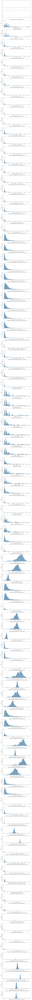

In [ ]:
fig, axes = plt.subplots(nrows=len(df_clean.columns), figsize=(10, 3*len(df_clean.columns)))
for i, col in enumerate(df_clean.columns):
    if pd.api.types.is_numeric_dtype(df_clean[col]):
        sns.histplot(df_clean[col], kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

In [ ]:
skewness = df_clean.select_dtypes(include=['float64', 'int64']).skew()
print(skewness)

number_hospitals_reporting_today                                     2.673832
total_hospitals                                                      2.738894
admissions_all_covid_confirmed                                       5.154789
admissions_70_covid_confirmed                                        4.561147
admissions_30_49_covid_confirmed                                     6.376370
                                                                       ...   
absolute_change_average_percent_staff_icu_beds_influenza             1.012660
absolute_change_average_percent_adult_inpatient_beds_occupied        0.194612
absolute_change_average_percent_pediatric_inpatient_beds_occupied   -3.056046
absolute_change_average_percent_staff_adult_icu_beds_occupied       -0.056821
absolute_change_average_percent_staff_pediatric_icu_beds_occupied    0.587196
Length: 101, dtype: float64


In [ ]:
def interpret_skewness(df_clean):
    numeric_df = df_clean.select_dtypes(include=['float64', 'int64'])
    skew_values = numeric_df.skew()

    skew_interpretation = {}
    for col, skew_val in skew_values.items():
        if abs(skew_val) < 0.5:
            interpretation = "Approximately symmetric"
        elif abs(skew_val) < 1:
            direction = "right" if skew_val > 0 else "left"
            interpretation = f"Moderately {direction}-skewed"
        else:
            direction = "right" if skew_val > 0 else "left"
            interpretation = f"Highly {direction}-skewed"

        skew_interpretation[col] = {
            'skewness': skew_val,
            'interpretation': interpretation
        }

    return pd.DataFrame.from_dict(skew_interpretation, orient='index')

skew_results = interpret_skewness(df_clean)
print(skew_results)

                                                    skewness  \
number_hospitals_reporting_today                    2.673832   
total_hospitals                                     2.738894   
admissions_all_covid_confirmed                      5.154789   
admissions_70_covid_confirmed                       4.561147   
admissions_30_49_covid_confirmed                    6.376370   
...                                                      ...   
absolute_change_average_percent_staff_icu_beds_...  1.012660   
absolute_change_average_percent_adult_inpatient...  0.194612   
absolute_change_average_percent_pediatric_inpat... -3.056046   
absolute_change_average_percent_staff_adult_icu... -0.056821   
absolute_change_average_percent_staff_pediatric...  0.587196   

                                                             interpretation  
number_hospitals_reporting_today                        Highly right-skewed  
total_hospitals                                         Highly right-skewed

Most of the columns seem to be highly skewd to the right, therefore, **Median** imputation provides a measure of central tendency that is robust to outliers and better represents the "typical" value in skewed distributions. The **median** will be closer to where most of the data points actually cluster (in the lower range of your distribution).
For the slightly symetrical columns we shall use the **mean** to impute the columns.

In [ ]:
from sklearn.impute import SimpleImputer
# Identifying columns for different imputation strategies based on skewness
numeric_cols = df_clean.select_dtypes(include=['float64', 'int64']).columns
skewness = df_clean[numeric_cols].skew()

high_skew_cols = skewness[skewness > 1].index.tolist()
low_skew_cols = skewness[abs(skewness) < 0.5].index.tolist()
median_imputer = SimpleImputer(strategy='median')
mean_imputer = SimpleImputer(strategy='mean')

if high_skew_cols:
    df_clean[high_skew_cols] = median_imputer.fit_transform(df_clean[high_skew_cols])
    print(f"Applied median imputation to {len(high_skew_cols)} skewed columns")

if low_skew_cols:
    df_clean[low_skew_cols] = mean_imputer.fit_transform(df_clean[low_skew_cols])
    print(f"Applied mean imputation to {len(low_skew_cols)} symmetric columns")

missing_after = df_clean[numeric_cols].isna().sum()
print("Missing values after imputation:")
print(missing_after)

Applied median imputation to 83 skewed columns
Applied mean imputation to 4 symmetric columns
Missing values after imputation:
number_hospitals_reporting_today                                        0
total_hospitals                                                         0
admissions_all_covid_confirmed                                          0
admissions_70_covid_confirmed                                           0
admissions_30_49_covid_confirmed                                        0
                                                                     ... 
absolute_change_average_percent_staff_icu_beds_influenza                0
absolute_change_average_percent_adult_inpatient_beds_occupied           0
absolute_change_average_percent_pediatric_inpatient_beds_occupied    2276
absolute_change_average_percent_staff_adult_icu_beds_occupied           0
absolute_change_average_percent_staff_pediatric_icu_beds_occupied    4199
Length: 101, dtype: int64


In [ ]:
# # Calculate correlation only on numeric columns
# all_cols = admissions_df.columns.intersection(df_clean.columns).tolist()
# numeric_cols_before = admissions_df[all_cols].select_dtypes(include=['float64', 'int64']).columns
# corr_before = admissions_df[numeric_cols_before].dropna().corr()

# numeric_cols_after = df_clean[all_cols].select_dtypes(include=['float64', 'int64']).columns
# # Calculate the correlation matrix after imputation
# corr_after = df_clean[numeric_cols_after].corr()
# corr_diff = corr_after - corr_before

Time Series Visualization of the Data set

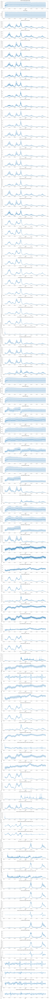

In [ ]:
df_clean['collection_date'] = pd.to_datetime(df_clean['collection_date'])
numeric_cols = df_clean.select_dtypes(include=['number']).columns.tolist()
numeric_cols = [c for c in numeric_cols if c != 'collection_date']

plt.figure(figsize=(15, len(numeric_cols) * 3))

for i, col in enumerate(numeric_cols, start=1):
    ax = plt.subplot(len(numeric_cols), 1, i)
    sns.lineplot(data=df_clean, x='collection_date', y=col, ax=ax)
    ax.set_title(col.replace('_', ' ').title())
    ax.set_xlabel('Date')
    ax.set_ylabel(col.replace('_', ' ').title())
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()


In [ ]:
# Define a list of state abbreviations to keep
state_abbreviations_to_keep = ['AZ', 'AK', 'DC', 'KY', 'LA', 'MI', 'MN', 'NH', 'NJ', 'NV', 'OR',
                               'RI', 'SC', 'VA', 'WY', 'HI', 'UT', 'AR', 'NM', 'CO', 'FL', 'GA',
                               'KS', 'MA', 'OK', 'TX', 'WV', 'AL', 'IA', 'IN', 'MS', 'ND', 'NE',
                               'NY', 'OH', 'PA', 'SD', 'TN', 'WA', 'CA', 'CT', 'DE', 'ID', 'IL',
                               'MD', 'ME', 'MO', 'MT', 'NC', 'VT', 'WI']

df_states_only = df_clean[df_clean['jurisdiction'].isin(state_abbreviations_to_keep)].copy()

print("Shape of DataFrame with only states:", df_states_only.shape)
print("\nUnique jurisdictions in the states-only DataFrame:")
print(df_states_only['jurisdiction'].unique())

Shape of DataFrame with only states: (32787, 103)

Unique jurisdictions in the states-only DataFrame:
['AZ' 'AK' 'DC' 'KY' 'LA' 'MI' 'MN' 'NH' 'NJ' 'NV' 'OR' 'RI' 'SC' 'VA'
 'WY' 'HI' 'UT' 'AR' 'NM' 'CO' 'FL' 'GA' 'KS' 'MA' 'OK']


In [ ]:
#rename the column to states
df_states_only = df_states_only.rename(columns={'jurisdiction': 'states'})

In [ ]:
df_states_only['collection_date'] = pd.to_datetime(df_states_only['collection_date'], dayfirst=True)


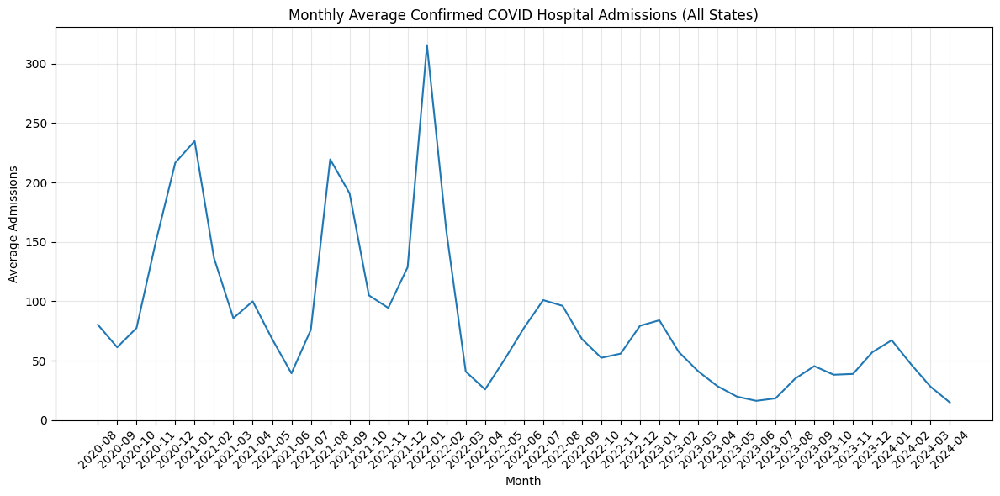

In [ ]:
# Aggregate data by month
df_states_only['year_month'] = df_states_only['collection_date'].dt.to_period('M')
monthly_avg_admissions = df_states_only.groupby('year_month')['average_admissions_all_covid_confirmed'].mean().reset_index()
monthly_avg_admissions['year_month'] = monthly_avg_admissions['year_month'].astype(str)

# Visualize the monthly averages
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_avg_admissions, x='year_month', y='average_admissions_all_covid_confirmed')
plt.title('Monthly Average Confirmed COVID Hospital Admissions (All States)')
plt.xlabel('Month')
plt.ylabel('Average Admissions')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Key insights:
- Admissions peaked sharply around December 2020, January 2021, and January 2022, with January 2022 showing the highest recorded levels.
- After mid-2022, the trend reveals a steady decline, indicating improved pandemic control, vaccinations, or other mitigating factors.
- The later months of 2023 and early 2024 show low and stable admissions, suggesting a shift towards post-pandemic hospital occupancy norms.


In [ ]:
print(df_states_only.columns)


Index(['states', 'collection_date', 'number_hospitals_reporting_today',
       'total_hospitals', 'admissions_all_covid_confirmed',
       'admissions_70_covid_confirmed', 'admissions_30_49_covid_confirmed',
       'admissions_50_69_covid_confirmed', 'admissions_50_59_covid_confirmed',
       'admissions_30_39_covid_confirmed',
       ...
       'absolute_change_average_percent_inpatient_beds_influenza',
       'icu_patients_influenza_confirmed', 'percent_staff_icu_beds_influenza',
       'average_percent_staff_icu_beds_influenza',
       'absolute_change_average_percent_staff_icu_beds_influenza',
       'absolute_change_average_percent_adult_inpatient_beds_occupied',
       'absolute_change_average_percent_pediatric_inpatient_beds_occupied',
       'absolute_change_average_percent_staff_adult_icu_beds_occupied',
       'absolute_change_average_percent_staff_pediatric_icu_beds_occupied',
       'year_month'],
      dtype='object', length=104)


Influenza admissions

Top 5 States by total influenza admissions:
states
FL    302536.0
MI    136329.0
AZ    132673.0
NJ    110219.0
MA    100221.0
Name: total_admissions_all_influenza_confirmed_past_7days, dtype: float64

Monthly influenza admissions for the top 5 jurisdictions:
    states    month  total_admissions_all_influenza_confirmed_past_7days
90      AZ  2020-08                                              403.0  
91      AZ  2020-09                                              390.0  
92      AZ  2020-10                                               41.0  
93      AZ  2020-11                                              441.0  
94      AZ  2020-12                                              700.0  
..     ...      ...                                                ...  
715     NJ  2023-12                                            10746.0  
716     NJ  2024-01                                            16192.0  
717     NJ  2024-02                                             9521.0  
718     NJ 

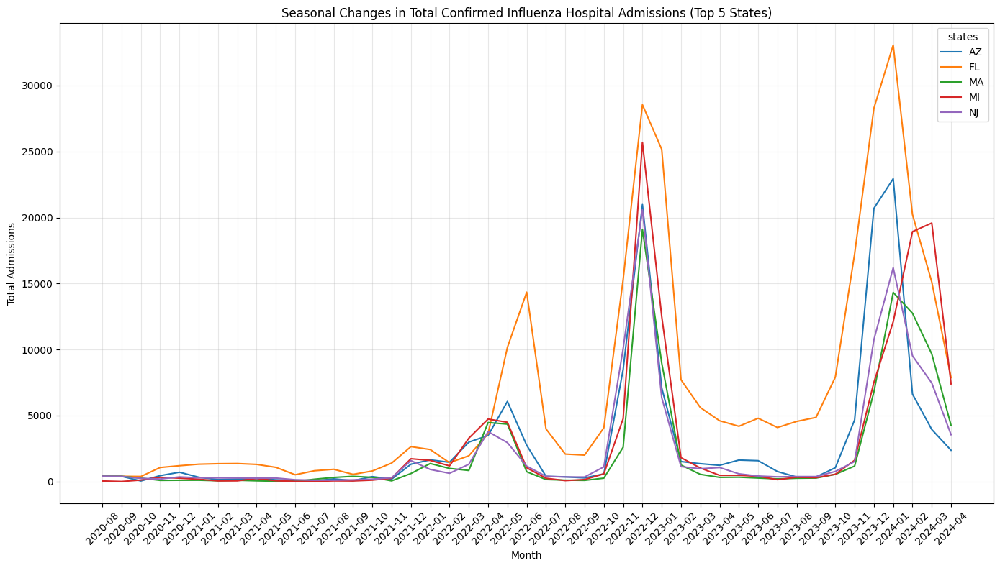

In [ ]:
df_states_only['month'] = df_states_only['collection_date'].dt.to_period('M')
monthly_influenza_by_state = df_states_only.groupby(['states', 'month'])[
    'total_admissions_all_influenza_confirmed_past_7days'
].sum().reset_index()

total_influenza_by_state = monthly_influenza_by_state.groupby('states')[
    'total_admissions_all_influenza_confirmed_past_7days'
].sum().sort_values(ascending=False)
print("Top 5 States by total influenza admissions:")
print(total_influenza_by_state.head(5))

top_5_states_influenza = total_influenza_by_state.head(5).index.tolist()
monthly_influenza_top_5 = monthly_influenza_by_state[
    monthly_influenza_by_state['states'].isin(top_5_states_influenza)
].copy()
monthly_influenza_top_5['month'] = monthly_influenza_top_5['month'].astype(str)

print("\nMonthly influenza admissions for the top 5 jurisdictions:")
print(monthly_influenza_top_5)
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_influenza_top_5,
             x='month',
             y='total_admissions_all_influenza_confirmed_past_7days',
             hue='states')
plt.title('Seasonal Changes in Total Confirmed Influenza Hospital Admissions (Top 5 States)')
plt.xlabel('Month')
plt.ylabel('Total Admissions')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


The line chart displays seasonal trends in total confirmed influenza hospital admissions from August 2020 to April 2024 across the top 5 U.S. states: AZ (Arizona), FL (Florida), MA (Massachusetts), MI (Michigan), and NJ (New Jersey).

Key Observations:

* Clear seasonal spikes occur roughly between November and February each year, aligning with typical flu seasons.

* Florida (FL) consistently shows the highest number of admissions, with major peaks in December 2022 and January 2024.

* Other states like Michigan (MI) and Arizona (AZ) also show sharp increases during peak flu seasons but at lower levels than Florida.

* A significant rise in admissions is evident in late 2022 and late 2023, suggesting particularly severe flu seasons during those periods.

* Overall, the data highlights strong seasonal patterns and state-level differences in influenza hospital admissions.









Top 5 states with highest average percent pediatric beds occupied:
states
RI    86.054812
DC    77.906557
MN    76.341964
AZ    73.952434
NJ    70.959893
Name: average_percent_pediatric_inpatient_beds_occupied, dtype: float64

Monthly data for top 5 jurisdictions:
    states    month  average_percent_pediatric_inpatient_beds_occupied
90      AZ  2020-08                                          63.495683
91      AZ  2020-09                                          64.152861
92      AZ  2020-10                                          59.392910
93      AZ  2020-11                                          59.042640
94      AZ  2020-12                                          58.989001
..     ...      ...                                                ...
896     RI  2023-12                                          84.809320
897     RI  2024-01                                          84.104928
898     RI  2024-02                                          84.645357
899     RI  2024-03      

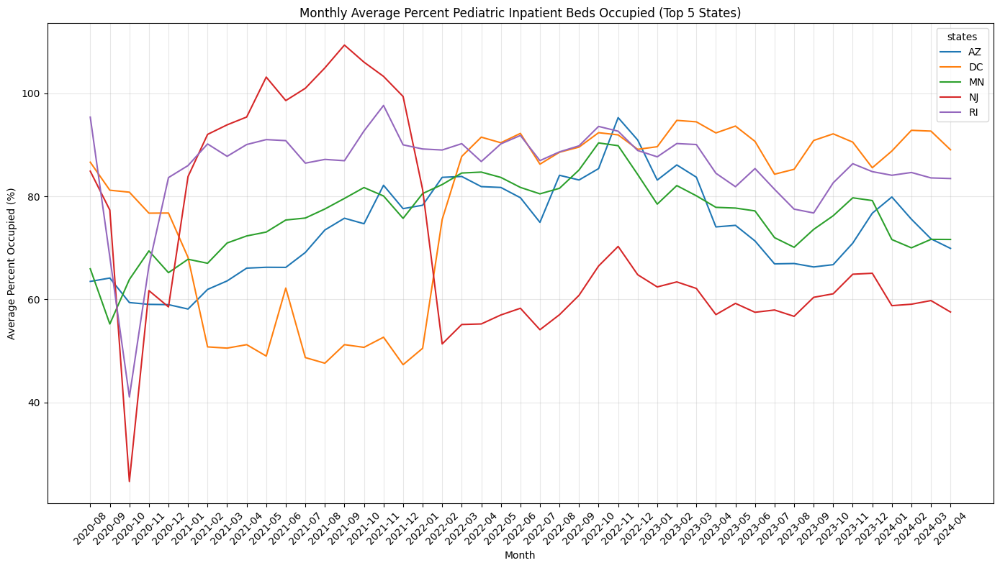

In [ ]:
# Create 'month' column from the collection date
df_states_only['month'] = df_states_only['collection_date'].dt.to_period('M')
monthly_pediatric_beds_by_state = df_states_only.groupby(['states', 'month'])[
    'average_percent_pediatric_inpatient_beds_occupied'
].mean().reset_index()
total_pediatric_beds_by_state = monthly_pediatric_beds_by_state.groupby('states')[
    'average_percent_pediatric_inpatient_beds_occupied'
].mean().sort_values(ascending=False)
print("Top 5 states with highest average percent pediatric beds occupied:")
print(total_pediatric_beds_by_state.head(5))
top_5_states_pediatric_beds = total_pediatric_beds_by_state.head(5).index.tolist()

monthly_pediatric_beds_top_5 = monthly_pediatric_beds_by_state[
    monthly_pediatric_beds_by_state['states'].isin(top_5_states_pediatric_beds)
].copy()
monthly_pediatric_beds_top_5['month'] = monthly_pediatric_beds_top_5['month'].astype(str)
print("\nMonthly data for top 5 jurisdictions:")
print(monthly_pediatric_beds_top_5)

plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_pediatric_beds_top_5,
             x='month',
             y='average_percent_pediatric_inpatient_beds_occupied',
             hue='states')
plt.title('Monthly Average Percent Pediatric Inpatient Beds Occupied (Top 5 States)')
plt.xlabel('Month')
plt.ylabel('Average Percent Occupied (%)')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


This graph illustrates the monthly average percentage of pediatric inpatient beds occupied in the top five U.S. states between August 2020 and April 2024.

Key insights:
- North Dakota (ND) experienced extreme fluctuations, with notable spikes in October 2020, December 2020, and November 2021—reaching occupancy rates far beyond 100%.
- Other states—DC, Minnesota (MN), Nebraska (NE), and Rhode Island (RI)—maintained relatively stable and lower occupancy rates, generally staying below 100% throughout the observed period.
- The data suggests North Dakota faced severe surges in demand for pediatric inpatient care, while the other states experienced more consistent, manageable occupancy rates.


Adult Inpatient Bed Occupancy Trends (Top 5 States)

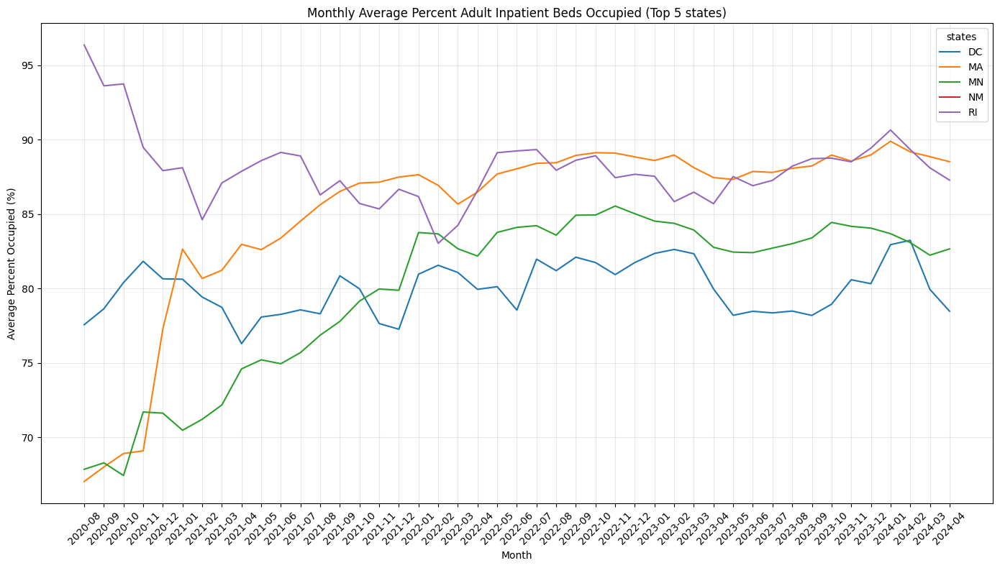

In [ ]:
monthly_adult_beds_by_state = df_states_only.groupby(['states', 'month'])[
    'average_percent_adult_inpatient_beds_occupied'
].mean().reset_index()
top_5_adult = monthly_adult_beds_by_state.groupby('states')[
    'average_percent_adult_inpatient_beds_occupied'
].mean().sort_values(ascending=False).head(5).index.tolist()
monthly_adult_top_5 = monthly_adult_beds_by_state[
    monthly_adult_beds_by_state['states'].isin(top_5_adult)
].copy()
monthly_adult_top_5['month'] = monthly_adult_top_5['month'].astype(str)

plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_adult_top_5,
             x='month',
             y='average_percent_adult_inpatient_beds_occupied',
             hue='states')
plt.title('Monthly Average Percent Adult Inpatient Beds Occupied (Top 5 states)')
plt.xlabel('Month')
plt.ylabel('Average Percent Occupied (%)')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


ICU Influenza Confirmed Patients Over Time

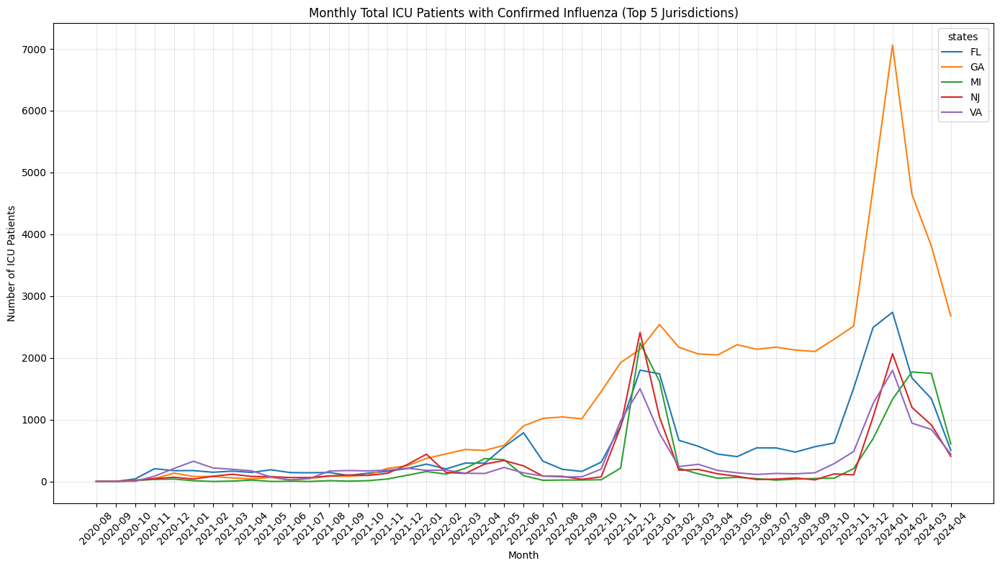

In [ ]:
monthly_icu_influenza = df_states_only.groupby(['states', 'month'])[
    'icu_patients_influenza_confirmed'
].sum().reset_index()
top_5_icu = monthly_icu_influenza.groupby('states')[
    'icu_patients_influenza_confirmed'
].sum().sort_values(ascending=False).head(5).index.tolist()
icu_top_5 = monthly_icu_influenza[monthly_icu_influenza['states'].isin(top_5_icu)].copy()
icu_top_5['month'] = icu_top_5['month'].astype(str)

plt.figure(figsize=(14, 8))
sns.lineplot(data=icu_top_5,
             x='month',
             y='icu_patients_influenza_confirmed',
             hue='states')
plt.title('Monthly Total ICU Patients with Confirmed Influenza (Top 5 Jurisdictions)')
plt.xlabel('Month')
plt.ylabel('Number of ICU Patients')
plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


Compare COVID vs. Influenza Admissions

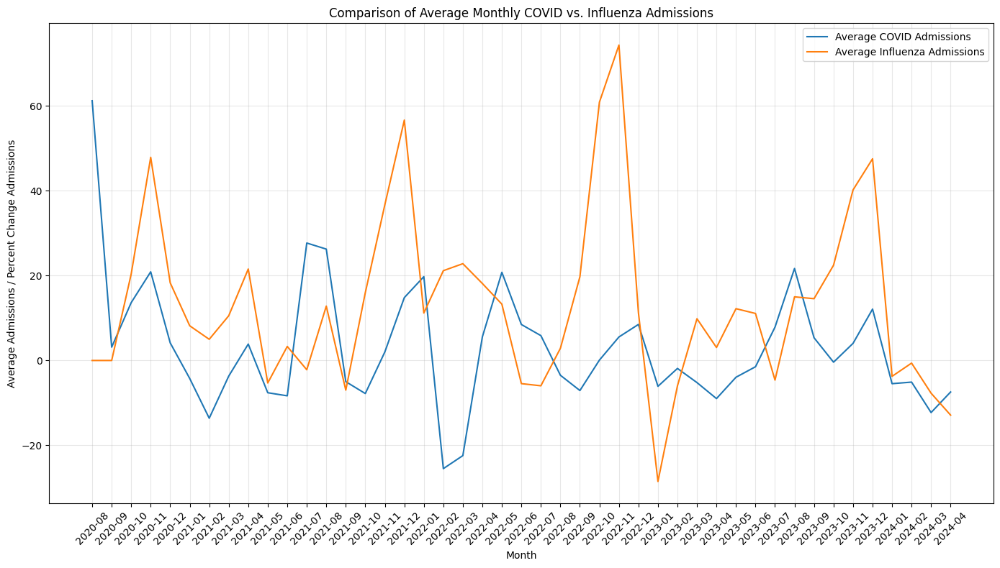

In [ ]:
covid_admissions = df_states_only.groupby('month')['percent_change_total_admissions_all_covid_confirmed_past_7days'].mean().reset_index()
influenza_admissions = df_states_only.groupby('month')['percent_change_total_admissions_all_influenza_confirmed_past_7days'].mean().reset_index()
covid_admissions['month'] = covid_admissions['month'].astype(str)
influenza_admissions['month'] = influenza_admissions['month'].astype(str)
merged_admissions = pd.merge(covid_admissions, influenza_admissions, on='month')

plt.figure(figsize=(14, 8))
sns.lineplot(data=merged_admissions, x='month', y= 'percent_change_total_admissions_all_covid_confirmed_past_7days', label='Average COVID Admissions')
sns.lineplot(data=merged_admissions, x='month', y='percent_change_total_admissions_all_influenza_confirmed_past_7days', label='Average Influenza Admissions')

plt.title('Comparison of Average Monthly COVID vs. Influenza Admissions')
plt.xlabel('Month')
plt.ylabel('Average Admissions / Percent Change Admissions')
plt.xticks(rotation=45)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

The line chart visually compares the average monthly percent change in hospital admissions for confirmed COVID-19 cases and confirmed influenza cases across selected US states from August 2020 to April 2024. The plot highlights that COVID-19 admissions displayed more volatile trends with higher percentage changes and larger peaks during the study period, notably in the winters of 2020-2021 and 2021-2022. In contrast, influenza admissions show a more predictable seasonal pattern with less dramatic percentage changes, indicating consistent but less extreme fluctuations compared to the COVID-19 surges seen during the pandemic.

# Feature Engineering and Preprocessing

Banding the different ages into only 3 groups: *young*, *middle-aged* and *aged*

In [ ]:
# Define the new age bands and the columns to include in each
# Updated age_bands based on the provided column names
age_bands = {
    'covid_admissions_young': ['admissions_18_29_covid_confirmed'],
    'covid_admissions_middle_aged': ['admissions_30_49_covid_confirmed', 'admissions_50_69_covid_confirmed'],
    'covid_admissions_geriatric': ['admissions_70_covid_confirmed']
}

for new_col, old_cols in age_bands.items():
    existing_cols = [col for col in old_cols if col in df_states_only.columns]
    if existing_cols:
        df_states_only[new_col] = df_states_only[existing_cols].sum(axis=1)
    else:
        print(f"Warning: None of the specified columns {old_cols} for '{new_col}' were found in the DataFrame.")

print(df_states_only[['covid_admissions_young', 'covid_admissions_middle_aged', 'covid_admissions_geriatric']].head())
df_states_only['young'] = df_states_only['covid_admissions_young']
df_states_only['middle_aged'] = df_states_only['covid_admissions_middle_aged']
df_states_only['elderly'] = df_states_only['covid_admissions_geriatric']
df_states_only[['young', 'middle_aged', 'elderly']].head()

   covid_admissions_young  covid_admissions_middle_aged  \
0                     9.0                          51.0   
1                     5.0                          58.0   
2                     8.0                          49.0   
3                    13.0                          55.0   
4                     8.0                          63.0   

   covid_admissions_geriatric  
0                        26.0  
1                        29.0  
2                        26.0  
3                        32.0  
4                        27.0  


,young,middle_aged,elderly
0,9.0,51.0,26.0
1,5.0,58.0,29.0
2,8.0,49.0,26.0
3,13.0,55.0,32.0
4,8.0,63.0,27.0


In [ ]:
# Calculate the overall average admissions for each age band
average_young_admissions = df_states_only['young'].mean()
average_middle_aged_admissions = df_states_only['middle_aged'].mean()
average_elderly_admissions = df_states_only['elderly'].mean()

print(f"Overall Average Young Admissions: {average_young_admissions:.2f}")
print(f"Overall Average Middle-Aged Admissions: {average_middle_aged_admissions:.2f}")
print(f"Overall Average Elderly Admissions: {average_elderly_admissions:.2f}")



Overall Average Young Admissions: 4.42
Overall Average Middle-Aged Admissions: 39.42
Overall Average Elderly Admissions: 34.43


## Aggregation

In [ ]:
df_time_indexed = df_states_only.set_index('collection_date')

In [ ]:
df_time_indexed.head(10)

,states,number_hospitals_reporting_today,total_hospitals,admissions_all_covid_confirmed,admissions_70_covid_confirmed,admissions_30_49_covid_confirmed,admissions_50_69_covid_confirmed,admissions_50_59_covid_confirmed,admissions_30_39_covid_confirmed,admissions_40_49_covid_confirmed,admissions_18_29_covid_confirmed,admissions_20_29_covid_confirmed,average_admissions_all_covid_confirmed,average_admissions_18_29_covid_confirmed,average_admissions_40_49_covid_confirmed,average_admissions_60_69_covid_confirmed,average_admissions_30_39_covid_confirmed,average_admissions_30_49_covid_confirmed,average_admissions_50_69_covid_confirmed,average_admissions_20_29_covid_confirmed,average_admissions_70_covid_confirmed,average_admissions_50_59_covid_confirmed,admissions_60_69_covid_confirmed,average_admissions_60_69_covid_confirmed_per_100k,average_admissions_50_59_covid_confirmed_per_100k,average_admissions_all_covid_confirmed_per_100k,average_admissions_30_39_covid_confirmed_per_100k,average_admissions_40_49_covid_confirmed_per_100k,average_admissions_70_covid_confirmed_per_100k,average_admissions_50_69_covid_confirmed_per_100k,average_admissions_20_29_covid_confirmed_per_100k,average_admissions_30_49_covid_confirmed_per_100k,average_admissions_18_29_covid_confirmed_per_100k,total_admissions_all_covid_confirmed_past_7days_per_100k,percent_change_total_admissions_all_covid_confirmed_past_7days_per_100k,total_patients_hospitalized_covid_confirmed,average_total_patients_hospitalized_covid_confirmed,total_adult_patients_hospitalized_covid_confirmed,total_pediatric_patients_hospitalized_covid_confirmed,inpatient_beds,average_inpatient_beds,inpatient_adult_beds,inpatient_pediatric_beds,inpatient_beds_used,average_inpatient_beds_occupied,inpatient_adult_beds_used,inpatient_pediatric_beds_used,total_icu_beds,total_staffed_adult_icu_beds,total_staffed_pediatric_icu_beds,staff_icu_adult_patients_covid_confirmed,staff_icu_pediatric_patients_covid_confirmed,icu_beds_used,staff_adult_icu_beds_occupied,staff_pediatric_icu_beds_occupied,staff_icu_patients_covid_confirmed,percent_inpatient_beds_occupied,percent_adult_inpatient_beds_occupied,percent_pediatric_inpatient_beds_occupied,percent_inpatient_beds_covid,percent_adult_inpatient_beds_covid,percent_pediatric_inpatient_beds_covid,percent_staff_icu_beds_occupied,percent_staff_adult_icu_beds_occupied,percent_staff_pediatric_icu_beds_occupied,percent_staff_icu_beds_covid,percent_staff_adult_icu_beds_covid,percent_staff_pediatric_icu_beds_covid,average_percent_inpatient_beds_occupied,absolute_change_average_percent_inpatient_beds_occupied,average_percent_adult_inpatient_beds_occupied,average_percent_pediatric_inpatient_beds_occupied,average_percent_inpatient_beds_covid,average_percent_adult_inpatient_beds_covid,average_percent_pediatric_inpatient_beds_covid,average_percent_staff_icu_beds_occupied,absolute_change_average_percent_staff_icu_beds_occupied,average_percent_staff_adult_icu_beds_occupied,average_percent_staff_pediatric_icu_beds_occupied,average_percent_staff_icu_beds_covid,average_percent_staff_adult_icu_beds_covid,average_percent_staff_pediatric_icu_beds_covid,total_admissions_all_covid_confirmed_past_7days,percent_change_total_admissions_all_covid_confirmed_past_7days,absolute_change_average_percent_inpatient_beds_covid,absolute_change_average_percent_staff_icu_beds_covid,total_admissions_all_influenza_confirmed_past_7days,percent_change_total_admissions_all_influenza_confirmed_past_7days,total_admissions_all_influenza_confirmed_past_7days_per_100k,percent_change_total_admissions_all_influenza_confirmed_past_7days_per_100k,total_patients_hospitalized_influenza_confirmed,percent_inpatient_beds_influenza,average_percent_inpatient_beds_influenza,absolute_change_average_percent_inpatient_beds_influenza,icu_patients_influenza_confirmed,percent_staff_icu_beds_influenza,average_percent_staff_icu_beds_influenza,absolute_change_average_percent_staff_icu_beds_influenza,absolute_change_average_percent_adult

Weekly Average COVID Confirmed Admissions (first 10 weeks):
collection_date
2020-08-02    97.985119
2020-08-09    88.134354
2020-08-16    77.056973
2020-08-23    81.396259
2020-08-30    71.488946
2020-09-06    68.318878
2020-09-13    63.705782
2020-09-20    59.715986
2020-09-27    56.638605
2020-10-04    59.494898
Freq: W-SUN, Name: average_admissions_all_covid_confirmed, dtype: float64

Weekly Average COVID Confirmed Admissions (last 10 weeks):
collection_date
2024-02-25    44.036565
2024-03-03    39.725340
2024-03-10    35.503401
2024-03-17    28.762755
2024-03-24    23.814626
2024-03-31    20.513605
2024-04-07    18.036565
2024-04-14    15.760204
2024-04-21    13.573980
2024-04-28    11.920635
Freq: W-SUN, Name: average_admissions_all_covid_confirmed, dtype: float64


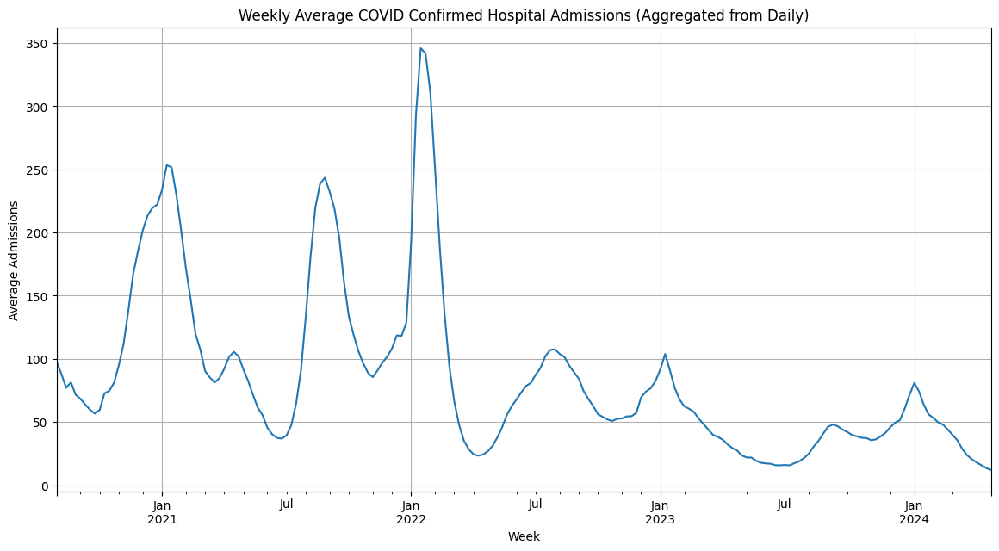

In [ ]:
# Resample to weekly frequency and calculate the mean of the daily averages
weekly_avg_admissions_from_daily = df_time_indexed['average_admissions_all_covid_confirmed'].resample('W').mean()

# we will show the first few weekly average admissions
print("Weekly Average COVID Confirmed Admissions (first 10 weeks):")
print(weekly_avg_admissions_from_daily.head(10))

# Show the last few weekly average admissions
print("\nWeekly Average COVID Confirmed Admissions (last 10 weeks):")
print(weekly_avg_admissions_from_daily.tail(10))

plt.figure(figsize=(14, 7))
weekly_avg_admissions_from_daily.plot()
plt.title('Weekly Average COVID Confirmed Hospital Admissions (Aggregated from Daily)')
plt.xlabel('Week')
plt.ylabel('Average Admissions')
plt.grid(True)
plt.show()

The "Aggregation" part of the code focuses on transforming the daily time series data into a lower frequency, specifically weekly.

**Why Aggregate?**

1.  **Smoother Trends:** Daily data can often be noisy with high day-to-day variability. Aggregating to a weekly frequency smooths out these fluctuations, making the underlying trends and seasonality clearer and easier to visualize and analyze.
2.  **Reduced Data Volume:** Working with weekly data significantly reduces the number of data points compared to daily data. This can improve computational efficiency for subsequent modeling steps, especially with larger datasets.
3.  Many public health metrics and reporting cycles are weekly. Aggregating to a weekly frequency can align the data with how it might be used or reported by public health agencies.

## ADF test

In [ ]:
from statsmodels.tsa.stattools import adfuller

result_weekly = adfuller(weekly_avg_admissions_from_daily.dropna())
print('ADF Statistic (Weekly): %f' % result_weekly[0])
print('p-value (Weekly): %f' % result_weekly[1])
print('Critical Values (Weekly):')
for key, value in result_weekly[4].items():
	print('\t%s: %.3f' % (key, value))

if result_weekly[1] <= 0.05:
	print("\nResult (Weekly): The weekly series is likely stationary (p-value <= 0.05)")
else:
	print("\nResult (Weekly): The weekly series is likely non-stationary (p-value > 0.05)")

ADF Statistic (Weekly): -3.733495
p-value (Weekly): 0.003666
Critical Values (Weekly):
	1%: -3.465
	5%: -2.877
	10%: -2.575

Result (Weekly): The weekly series is likely stationary (p-value <= 0.05)


## ACF & PACF Plots

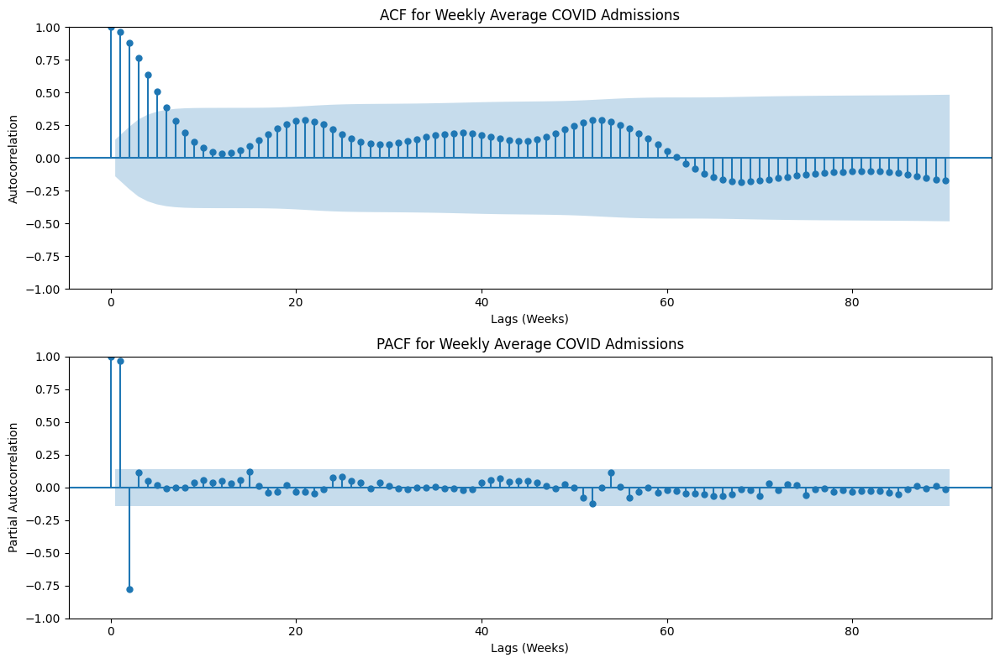

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot ACF and PACF for the weekly data
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

# Plot ACF
plot_acf(weekly_avg_admissions_from_daily.dropna(), lags=90, ax=axes[0]) # Up to 2 years of weekly lags
axes[0].set_title('ACF for Weekly Average COVID Admissions')
axes[0].set_xlabel('Lags (Weeks)')
axes[0].set_ylabel('Autocorrelation')

# Plot PACF
plot_pacf(weekly_avg_admissions_from_daily.dropna(), lags=90, ax=axes[1]) # Up to 2 years of weekly lags
axes[1].set_title('PACF for Weekly Average COVID Admissions')
axes[1].set_xlabel('Lags (Weeks)')
axes[1].set_ylabel('Partial Autocorrelation')

plt.tight_layout()
plt.show()

ADF, ACF, and PACF plots are essential tools for analyzing the structure of time series data, particularly for identifying stationarity and the presence of autoregressive (AR) and moving average (MA) components, which helps in selecting appropriate time series models like ARIMA.

*   **ADF Plot (Augmented Dickey-Fuller Test):** This is a statistical test used to determine if a time series is stationary. A stationary time series has constant statistical properties over time (mean, variance, and autocorrelation). The ADF test checks for a unit root, which is a characteristic of non-stationary series. A low p-value (typically <= 0.05) suggests that the time series is stationary or can be made stationary through differencing.

*   **ACF Plot (Autocorrelation Function):** The ACF plot shows the correlation between a time series and its lagged values at different time points (lags). It helps identify the extent to which the current value of the series is linearly related to past values.
    *   Slowly decaying ACF values often indicate a non-stationary series.
    *   Significant spikes at specific lags suggest seasonality or patterns that repeat at those intervals.
    *   It helps determine the order of the Moving Average (MA) component in ARIMA models.

*   **PACF Plot (Partial Autocorrelation Function):** The PACF plot shows the correlation between a time series and its lagged values, after removing the influence of the intermediate lags. It helps isolate the direct correlation between the current value and a specific lag.
    *   Significant spikes in the PACF plot that cut off after a certain number of lags suggest the order of the Autoregressive (AR) component in ARIMA models.
    *   It helps determine the order of the Autoregressive (AR) component in ARIMA models.

In summary, the ADF test indicates if differencing is needed, while the ACF and PACF plots help determine the appropriate orders (p and q) for the AR and MA components, respectively, in a time series model like ARIMA, based on the patterns of significant autocorrelations.

## Moving Average

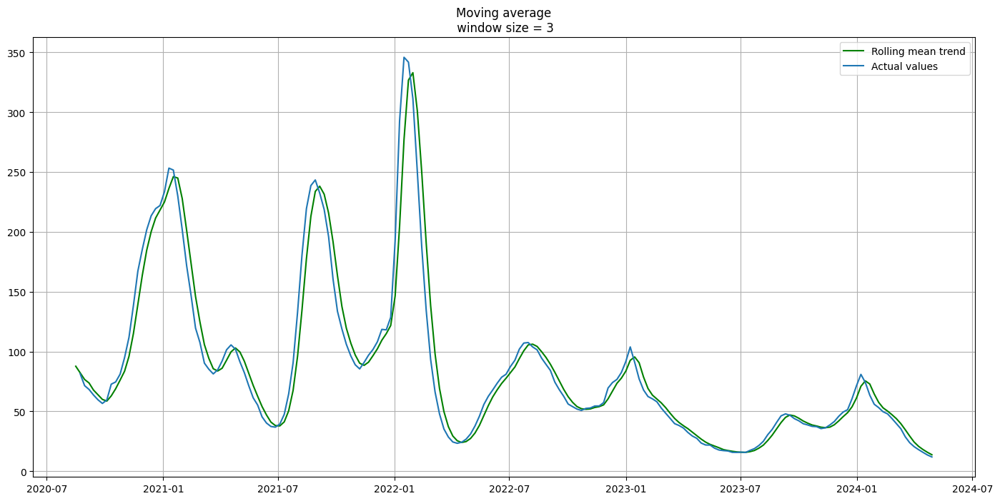

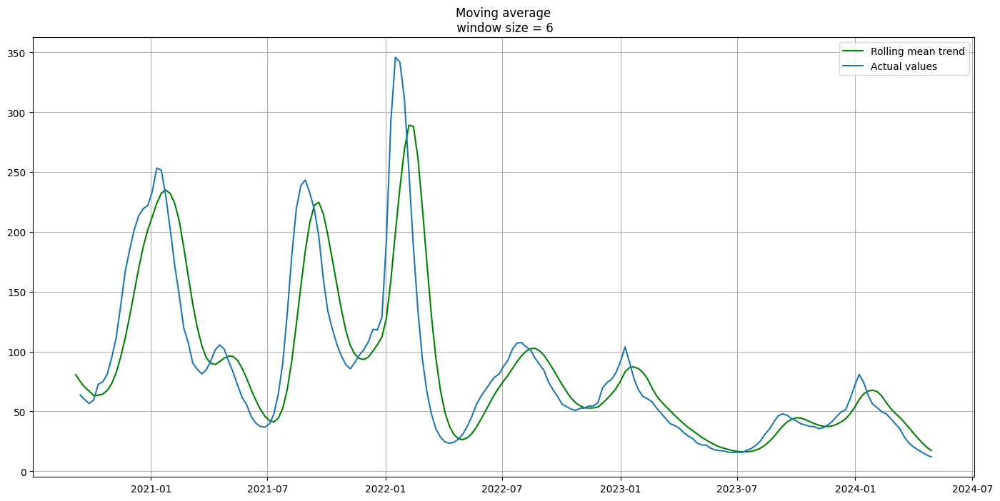

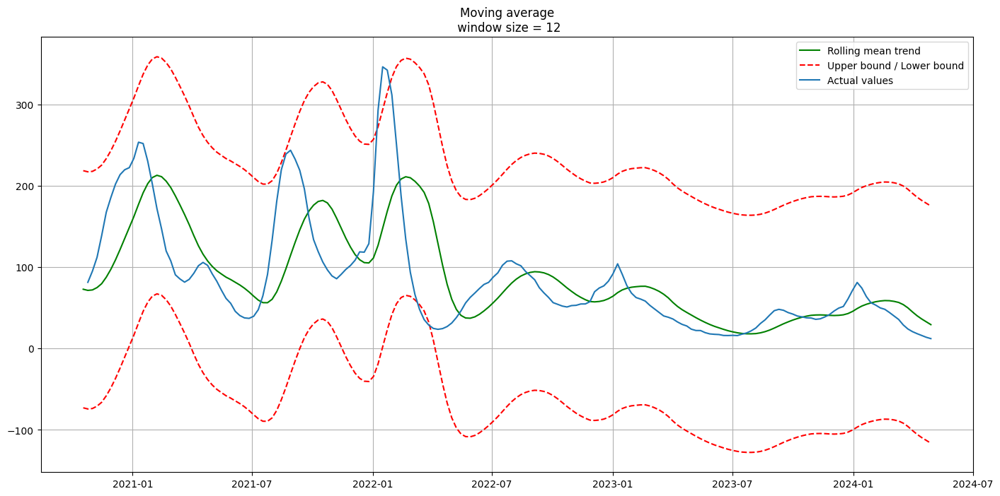

In [ ]:
# Moving Average

from sklearn.metrics import mean_absolute_error
def plot_moving_average(series, window, plot_intervals=False, scale=1.96):

    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(17, 8))
    plt.title('Moving average\n window size = {}'.format(window))
    plt.plot(rolling_mean, 'g', label='Rolling mean trend')

    if plot_intervals:

        if len(series) > window:
            mae = mean_absolute_error(series[window:], rolling_mean[window:])
            deviation = np.std(series[window:] - rolling_mean[window:])
            lower_bound = rolling_mean - (mae + scale * deviation)
            upper_bound = rolling_mean + (mae + scale * deviation)

            plt.plot(upper_bound, 'r--', label='Upper bound / Lower bound')
            plt.plot(lower_bound, 'r--')
        else:
            print(f"Warning: Not enough data points ({len(series)}) to calculate intervals with window size {window}. Skipping interval plotting.")

    plt.plot(series[window:], label='Actual values')
    plt.legend(loc='best')
    plt.grid(True)
    plt.show()


# Smooth by the previous 3 months
plot_moving_average(weekly_avg_admissions_from_daily.dropna(), window=3)

# Smooth by the previous 6 months
plot_moving_average(weekly_avg_admissions_from_daily.dropna(), window=6)

# Smooth by previous 12 months
plot_moving_average(weekly_avg_admissions_from_daily.dropna(), window=12, plot_intervals=True)


A Moving Average (MA) is a technique used in time series analysis to smooth out short-term fluctuations and highlight longer-term trends or cycles in the data.

It works by calculating the average of data points within a defined 'window' of time (e.g., the previous 3 months, 6 months, or 12 months). As new data points become available, the window 'moves' forward, and the average is recalculated, creating a continuous line that represents the smoothed trend.

In the provided code, the `plot_moving_average` function calculates and plots this rolling mean for different window sizes (3, 6, and 12 months). The smoothed line shows the general direction of the 'average_admissions_all_covid_confirmed' data, making it easier to see the overall patterns and ignore the day-to-day noise. The option to plot confidence intervals helps visualize the expected range of values around the smoothed trend.

Exponential smoothing

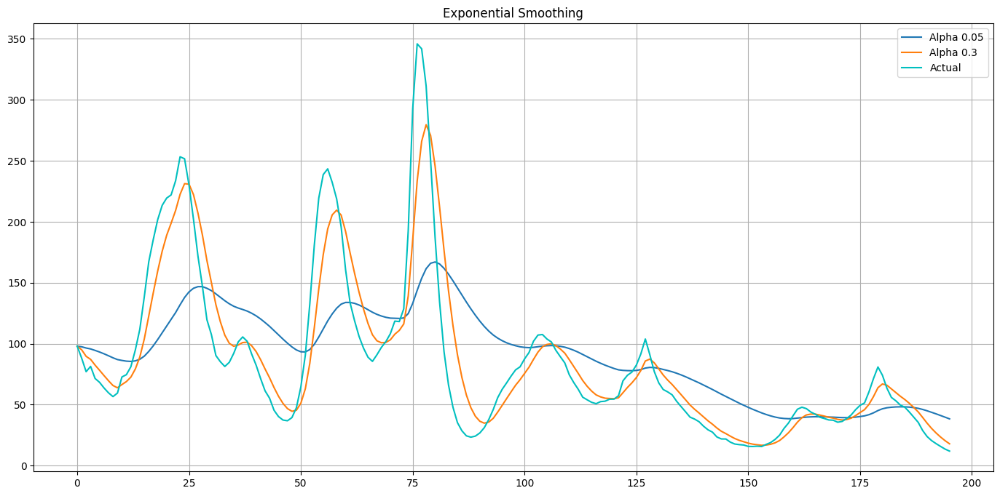

In [ ]:
#exponential smoothing
def exponential_smoothing(series, alpha):
    result = [series[0]]
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

def plot_exponential_smoothing(series, alphas):
    plt.figure(figsize=(17, 8))
    for alpha in alphas:
        plt.plot(exponential_smoothing(series.values, alpha), label="Alpha {}".format(alpha))
    plt.plot(series.values, "c", label = "Actual")
    plt.legend(loc="best")
    plt.axis('tight')
    plt.title("Exponential Smoothing")
    plt.grid(True);

plot_exponential_smoothing(weekly_avg_admissions_from_daily.dropna(), [0.05, 0.3])

Exponential Smoothing is a time series forecasting method that assigns exponentially decreasing weights to past observations. More recent observations are given higher weights, while older observations are given exponentially smaller weights. This makes it particularly suitable for data where the underlying process changes over time.

The core idea is to calculate a smoothed value at each time step that is a weighted average of the current observation and the previous smoothed value. The parameter 'alpha' (α), the smoothing factor, controls how much weight is given to the most recent observation.

- A **high alpha (close to 1)** means the smoothed value is heavily influenced by the current observation, making it more responsive to recent changes but potentially more sensitive to noise.
- A **low alpha (close to 0)** means the smoothed value is more influenced by the previous smoothed value, resulting in a smoother line that is less responsive to recent changes but more robust to noise.

* As you can see, an alpha value of 0.05 smoothed the curve while picking up most of the upward and downward trends.

Differencing

ADF Statistic (Differenced Weekly): -6.235104
p-value (Differenced Weekly): 0.000000
Critical Values (Differenced Weekly):
	1%: -3.465
	5%: -2.877
	10%: -2.575

Result (Differenced Weekly): The differenced weekly series is likely stationary (p-value <= 0.05)


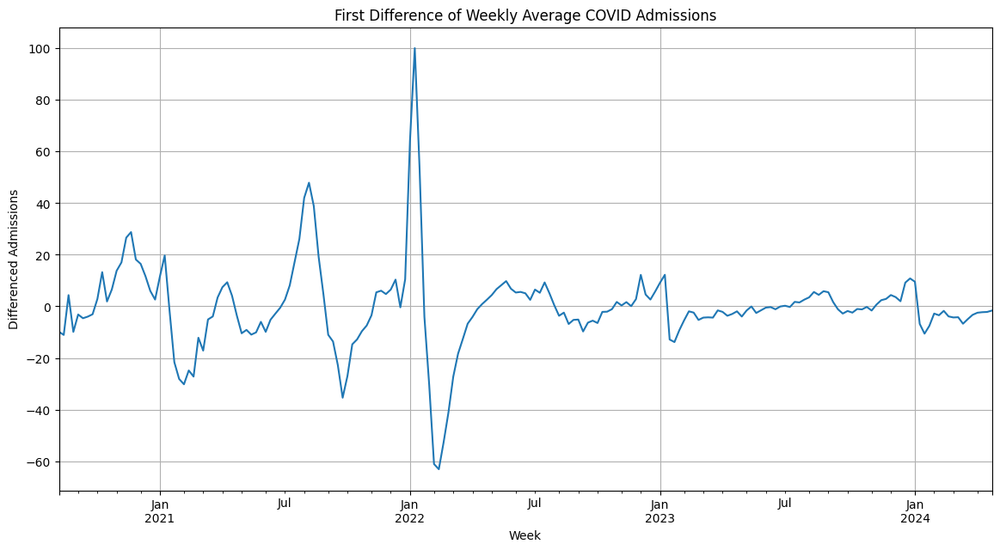

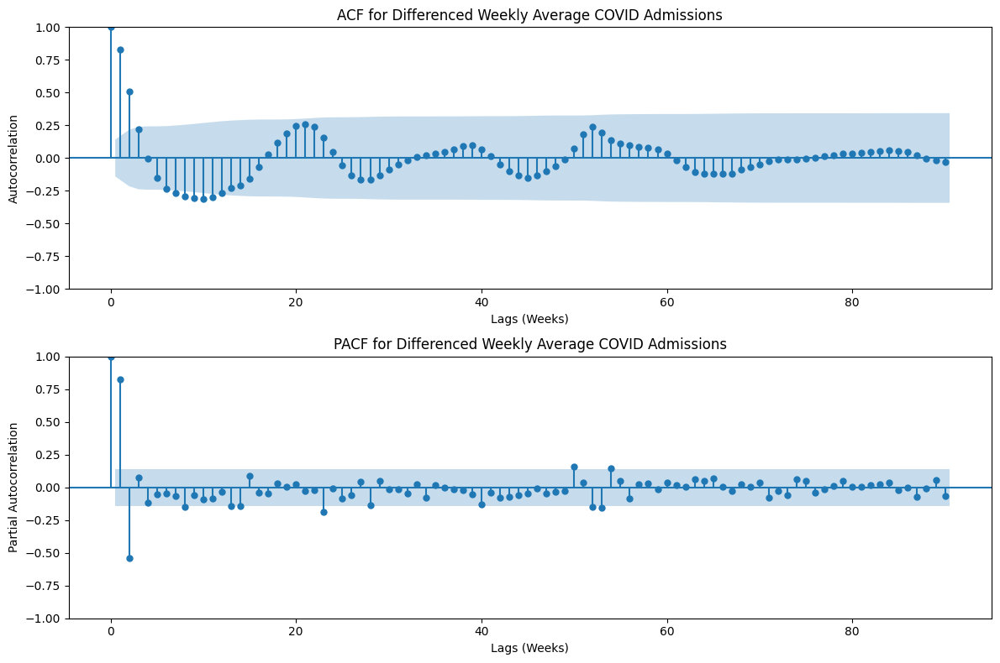

In [ ]:
# Perform differencing on the weekly average admissions series
weekly_avg_admissions_diff = weekly_avg_admissions_from_daily.diff().dropna()

# Perform ADF test on the differenced weekly data
result_weekly_diff = adfuller(weekly_avg_admissions_diff)
print('ADF Statistic (Differenced Weekly): %f' % result_weekly_diff[0])
print('p-value (Differenced Weekly): %f' % result_weekly_diff[1])
print('Critical Values (Differenced Weekly):')
for key, value in result_weekly_diff[4].items():
    print('\t%s: %.3f' % (key, value))

if result_weekly_diff[1] <= 0.05:
    print("\nResult (Differenced Weekly): The differenced weekly series is likely stationary (p-value <= 0.05)")
else:
    print("\nResult (Differenced Weekly): The differenced weekly series is likely non-stationary (p-value > 0.05)")

plt.figure(figsize=(14, 7))
weekly_avg_admissions_diff.plot()
plt.title('First Difference of Weekly Average COVID Admissions')
plt.xlabel('Week')
plt.ylabel('Differenced Admissions')
plt.grid(True)
plt.show()

fig, axes = plt.subplots(2, 1, figsize=(12, 8))

# Plot ACF of differenced weekly data
plot_acf(weekly_avg_admissions_diff, lags=90, ax=axes[0])
axes[0].set_title('ACF for Differenced Weekly Average COVID Admissions')
axes[0].set_xlabel('Lags (Weeks)')
axes[0].set_ylabel('Autocorrelation')

# Plot PACF of differenced weekly data
plot_pacf(weekly_avg_admissions_diff, lags=90, ax=axes[1])
axes[1].set_title('PACF for Differenced Weekly Average COVID Admissions')
axes[1].set_xlabel('Lags (Weeks)')
axes[1].set_ylabel('Partial Autocorrelation')

plt.tight_layout()
plt.show()

Based on the plots after differencing the data:

1.  **First Difference of Weekly Average COVID Admissions Time Series Plot:** This plot shows the week-over-week change in average COVID admissions. The strong upward and downward trends present in the original data are largely removed. The series now fluctuates around zero, suggesting that applying a first difference has successfully removed the non-stationarity caused by trend. The variance might still appear somewhat non-constant (heteroskedasticity), but the mean is more stable.

2.  **ACF and PACF of Differenced Weekly Average COVID Admissions Plots:**
    *   **ACF Plot:** This plot shows the correlation between the series and its lagged values. After differencing, the autocorrelations decay much faster compared to the original series. There might be significant spikes at certain lags (like seasonal lags, e.g., multiples of 52 for annual seasonality in weekly data, though the plots don't show distinct strong seasonal spikes at 52 or its multiples after just one difference). This indicates that the first difference has reduced the overall dependence across time, supporting the idea of stationarity.
    *   **PACF Plot:** This plot shows the partial correlation, which is the correlation between the series and its lag after removing the influence of intermediate lags. Significant spikes in the PACF at specific lags can indicate the order of the autoregressive (AR) component needed for an ARIMA model.

Overall, the differencing process, specifically the first difference, appears to have made the weekly average COVID admissions time series more stationary, which is a necessary step for applying many time series forecasting models like ARIMA. The ACF and PACF plots of the differenced series help in identifying potential AR and MA components needed for such models.